# Stochastic stranding
__Суммарное количество баллов: 8__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[ML][HW11] <ФИ>`, где вместо `<ФИ>` указаны фамилия и имя__

По бескрайним каменным джунглям от заказа к заказу бродят курьеры. Их задача - как можно быстрее доставить все заказы, чтобы взять новые. Ничто не может заставить их покинуть вечный цикл доставки.

In [ ]:
import numpy as np
import pandas
import random
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
import matplotlib
import copy
from itertools import permutations, combinations
from collections import OrderedDict

In [ ]:
def get_colors(distances, alpha=True):
    normed = np.array(distances) - np.min(distances)
    normed = normed / np.max(normed)
    alpha = 1/np.mean([len(row) for row in normed])**0.5 if alpha else 1.
    return [[((1. if n > 0.5 else 2 * n), (1. if n < 0.5 else 2 - 2*n), 0., alpha) 
             for n in row] for row in normed]

def get_coords(points):
    results = []
    for pts in points:
        x_prev, _ = pts[0]
        result = [pts[0]]
        for x, y in list(pts[1:]) + [pts[0]]:
            result.append((x_prev, y))
            result.append((x, y))
            x_prev = x
        results.append(list(zip(*result)))
    return results

def init_figure(X):
    upper_bound, lower_bound = X.max(axis=0) + 1, X.min(axis=0) - 1
    fig, ax = plt.subplots(figsize=(10, 10), nrows=1, ncols=1)
    #ax.set_facecolor((0.1, 0.1, 0.1))
    ax.grid(True)
    #ax.grid(True, color=(0.9, 0.9, 0.9))
    ax.set_xticks(range(lower_bound[0], upper_bound[0]))
    ax.set_yticks(range(lower_bound[1], upper_bound[1]))
    ax.set_xlim(lower_bound[0], upper_bound[0])
    ax.set_ylim(lower_bound[1], upper_bound[1])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.scatter(X[:, 0], X[:, 1], color=(0, 0, 1))
    plt.tight_layout()
    return fig, ax    

def visualize_hillclimb(X, hillclimb):
    fig, ax = init_figure(X)
    permutations = hillclimb.optimize_explain(X)
    colors = get_colors([[cyclic_distance(X[p], hillclimb.dist) for p in permutations]], False)[0]
    coords = get_coords([X[p] for p in permutations])
    plot = ax.plot(coords[0][0], coords[0][1], color=colors[0])[0]
    
    def animate(i):
        plot.set_color(colors[i])
        plot.set_data(*coords[i])
        return (plot,)
    
    return animation.FuncAnimation(fig, animate, frames=len(permutations), interval=100, blit=True)

def visualize_genetic(X, genetic):
    fig, ax = init_figure(X)
    populations = genetic.optimize_explain(X)
    distances = [[cyclic_distance(X[p], genetic.dist) for p in populations[i]] for i in range(len(populations))]
    colors = get_colors(distances)
    coords = get_coords([X[p] for p in populations[0]])
    plots = [ax.plot(x, y, color=c)[0] for (x, y), c in zip(coords, colors[0])]
    best_id = np.argmin(distances[0])
    best_plot = ax.plot(*coords[best_id], color=(0.3, 0.3, 1, 0.9), linestyle="-.")[0]
    
    def animate(i):
        coords = get_coords([X[p] for p in populations[i]])
        for p, (x, y), c in zip(plots, coords, colors[i]):
            p.set_color(c)
            p.set_data(x, y)
        best_id = np.argmin(distances[i])
        best_plot.set_data(*coords[best_id])
        return plots + [best_plot]
    
    return animation.FuncAnimation(fig, animate, frames=len(populations), interval=100, blit=True)
    return populations

In [ ]:
def synthetic_points(count=25, dims=2):
    return np.random.randint(40, size=(count, dims))

X = synthetic_points()

### Задание 1 (1 балл)
Для начала научимся считать расстояния, которые курьерам придется преодолеть. Если бы они доставляли еду в пустыне, то им бы было достаточно считать евклидовы расстояния, т.к. можно просто идти напрямик. Однако курьеры доставляют еду только в городе, и двигаться могут только вдоль улиц. Поэтому нам понадобится манъэттенское расстояние.

#### Функции
`cyclic_distance(points, dist)` - возвращает суммарное расстояние пройденное курьером по циклу из точек `points` посчитанное при помощи функции `dist`.

`l2_distance(p1, p2)` - возвраает euclidean distance между точками.

`l1_distance(p1, p2)` - возвращает manhattan distance между точками.

In [ ]:
def cyclic_distance(points, dist):
    number_of_routes = len(points) - 1
    return np.sum([dist(points[i], points[i + 1]) for i in range(number_of_routes)])

def l2_distance(p1, p2):
    return np.sqrt(np.sum((pow(p1 - p2, 2))))

def l1_distance(p1, p2):
    return np.sum(abs(p1 - p2))

### Задание 2 (3 балла)
Курьер получил карту расположения заказов на карте. Ему хочется побыстрее обойти все точки. Для этого он хочет воспользоваться методом HillClimb, а вам предстоит ему в этом помочь. Реализуйте данный метод.

#### Методы
`optimize_explain(X)` - возвращает список из перестановок точек `X`, полученных в процессе оптимизации. Перестановка должна попадать в список после каждого изменения. Метод должен совершить не больше `max_iterations` итераций, на каждой из них необходимо рассмотреть все возможные пары индексов.

#### Параметры конструктора
`max_iterations` - максимальное количество итераций в методе `optimize_explain`

`dist` - функция расстояния

In [ ]:
class HillClimb:
    def __init__(self, max_iterations, dist):
        self.max_iterations = max_iterations
        self.dist = dist # Do not change

    def optimize(self, X):
        return self.optimize_explain(X)[-1]

    def optimize_explain(self, X):
        mask = np.random.choice(X.shape[0], X.shape[0], replace=False)
        all_permutations = []
        all_permutations.append(mask)
        all_combinations = list(combinations(mask, 2))
        number_of_combinations = len(all_combinations)

        for _ in range(self.max_iterations):
            for i in range(number_of_combinations):

                flag = False
                best_permutation = copy.deepcopy(mask)
                x1, x2 = all_combinations[i]

                if x1 > x2:
                    x1, x2 = x2, x1

                # outer neighbours of end points
                a, b = max(0, x1 - 1), min(x2 + 1, X.shape[0] - 1)

                # inner neighbours of end points (if exist)
                if x2 - x1 > 1:
                    c, d = min(x1 + 1, X.shape[0] - 1), max(x2 - 1, 0)
                    flag = True

                if self.dist(X[mask[x2]], X[mask[a]]) + self.dist(X[mask[x1]], X[mask[b]]) < \
                    self.dist(X[mask[x1]], X[mask[a]]) + self.dist(X[mask[x2]], X[mask[b]]):
                    if flag:
                        if self.dist(X[mask[x2]], X[mask[d]]) + self.dist(X[mask[x1]], X[mask[c]]) < \
                            self.dist(X[mask[x2]], X[mask[c]]) + self.dist(X[mask[x1]], X[mask[d]]):
                            temporary_slice = copy.deepcopy(mask[c:d+1])
                            temporary_slice = temporary_slice[::-1]
                            best_permutation[c:d+1] = temporary_slice        
                    best_permutation[x1], best_permutation[x2] = best_permutation[x2], best_permutation[x1]
                    all_permutations.append(best_permutation)
                    mask = best_permutation
                    break
        
        ClimbHillResult = cyclic_distance(X[all_permutations[-1]], self.dist)
        print(f'Route size achived: {ClimbHillResult}')

        return all_permutations    

Route size achived: 210


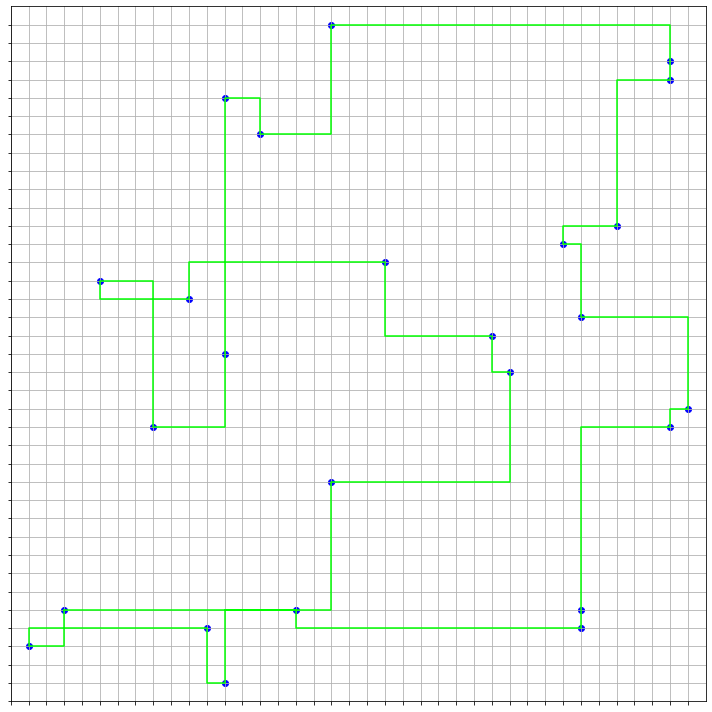

In [ ]:
hc = HillClimb(100, l1_distance)
HTML(visualize_hillclimb(X, hc).to_jshtml())

### Задание 3 (4 балла)
Курьерское дело растет, теперь между городами блуждает большое количество курьеров, а их профессия вместе с известным маршрутом передается из поколения в поколение. Чем быстрее курьер способен обойти города - тем больше вероятность того, что он заработает себе на безоблачную старость и передаст свое дело потомкам. Симулируйте эволюцию курьеров, реализовав генетический алгоритм.

#### Методы
`optimize(X)` - выбирает лучшую перестановку из результатов `optimize_explain(X)`

`optimize_explain(X)` - возвращает список длины `iterations` популяций размера `population` перестановок точек `X`, полученных в процессе оптимизации. На каждом шаге алгоритм должен оставлять только `survivors` выживших, следующая популяция должна быть сгенерирована из них

In [ ]:
class Genetic:
    def __init__(self, iterations, population, survivors, distance):
        self.pop_size = population
        self.surv_size = survivors
        self.dist = distance
        self.iters = iterations
  
    
    def optimize_explain(self, X):

        # initialization
        mask = lambda X: np.random.choice(X.shape[0], X.shape[0], replace=False)     
        survivors = [mask(X) for i in range(self.pop_size)]
  
        AllPopulations = np.empty(self.iters, dtype=list)
        CrossingPairs = list(combinations(range(self.surv_size - 1), 2))
        pairs_size = len(CrossingPairs)

        for i in range(self.iters):
            survivors = self.optimize(X, survivors)
            population = np.empty(self.pop_size, dtype=list)

            # crossing
            for j in range(self.pop_size):
                tao = random.random()
                rand_size = int(self.surv_size * tao)
                n = np.random.randint(0, pairs_size, 1)[0]
                indx1, indx2 = CrossingPairs[n]
                CrossingObj1 = copy.deepcopy(survivors[indx1])
                CrossingObj2 = copy.deepcopy(survivors[indx2])

                crossing = -np.ones_like(CrossingObj1)
                crossing[:rand_size] = CrossingObj1[:rand_size]
                crossing[rand_size:] = [v for v in CrossingObj2 if v not in crossing]

                # mutation 
                indx1, indx2 = np.random.randint(0, self.surv_size, 2)
                crossing[indx1], crossing[indx2] = crossing[indx2], crossing[indx1]

                population[j] = crossing

            survivors = population
            AllPopulations[i] = population
 
        EvolutionResult = cyclic_distance(X[AllPopulations[-1][-1]], self.dist)
        print(f'Route size achived: {EvolutionResult}')

        return AllPopulations


    def optimize(self, X, routes):
    # find top survivors
        RunnersRoutes = []
        for _, route in enumerate(routes):
            RunnersRoutes.append((route, cyclic_distance(X[route], self.dist)))
        SortedRoutes = sorted(RunnersRoutes, key=lambda x: x[1])
        survivors = [SortedRoutes[n][0] for n in range(len(SortedRoutes))]
        return survivors[:self.surv_size]


Route size achived: 274


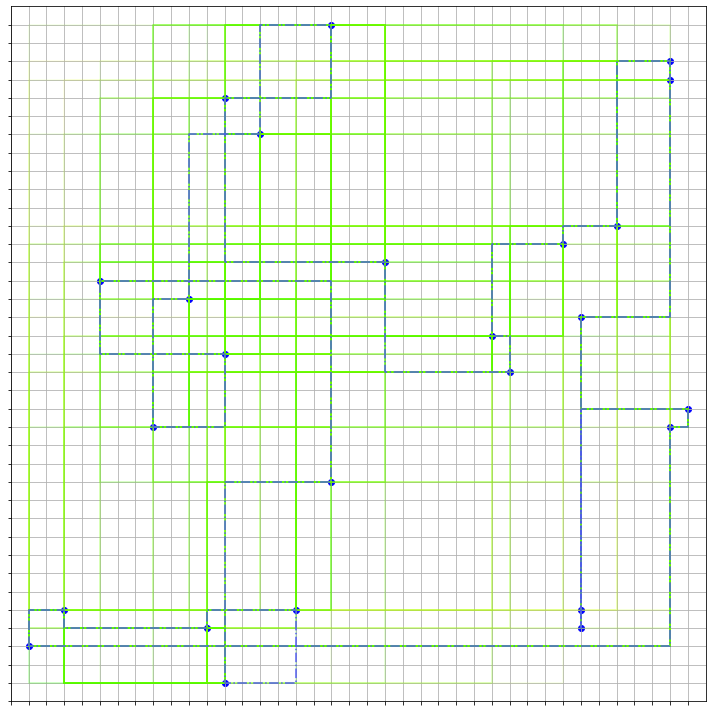

In [ ]:
gen = Genetic(200, 100, 20, l1_distance)
HTML(visualize_genetic(X, gen).to_jshtml())